# Final Project: Getting Unstuck Reflections

## Framing

In this notebook, I share some of the research questions and explorations of data from a summer professional learning experience for K-12 Scratch teachers. Although I was hoping to have something more final to share, this is very much exploratory in nature, though I have some ideas about where to go from here. Because of the exploration, the analysis below is less of a progression and more of a collection of different ideas. Additional feedback/ideas on how to analyze the data certainly welcome!

# Introduction

We have 3784 projects from Getting Unstuck, a 21-day summer online learning experience from July 2018. These are projects that K-12 teachers made in Scratch, and each day they responded to a different prompt. Projects vary in size and scope; participants had varied levels of experience.

## Research question(s)
* What did people learn? 
* How did they talk about what they learned? 
* How did reflecting support their learning?
* How is reflective writing connected to persistence in the program?

## Hypotheses

    
### Hypothesis one: Learners who wrote more reflections had a deeper/multifaceted learning experience/their reflections supported their learning in meaningful ways.

* They participated more in the online community.
* Their computational fluency was deeper.
* They learned more aobut their own tendencies for "getting stuck."

#### Background:
We know from constructionist theories that environments that promote creating, sharing, reflecting, and personalizing can support learners in engaging in deeply meaningful work (Brennan, 2013). Often, the "reflecting" part is taken for granted, or seen as less essential when teachers have limited amounts of time. And yet, supporting teachers in becoming increasingly reflective practitioners can support productive growth of their teaching practice (Schön, 1987).

In what ways does reflecting help learners learn/help us as researchers understand what learners made? 


### Hypothesis two: Learners who tagged each other more often had a deeper learning experience.

* They participated more in the online community.
* Their computational fluency was deeper.
* They were able to support others (reciprocal tagging?)

#### Background:
From the communities of practice literature (Lave & Wenger, 1991), we know that learners who engage in legitimate peripheral participation in a community of practice can develop meaningfully from novices to experts. 

In the Getting Unstuck online community, did learners feel like they were in a community? Or did they operate by themselves, receiving the challenge emails each day and posting their projects? Did they interact with others' projects? How did those interactions support their learning? (See also: Illich, 1970).






## Results
    
### Hypothesis One
I was hoping to test the first hypothesis by doing some descriptive work to get a sense of what's in the data: sentiment analysis, topic modeling. 
* How many projects have written text accompanying them?
* Of those projects, how many include text that counts as "reflection"?
* Of those reflective projects, what did they talk about?

### Hypothesis Two
I was hoping to perhaps build a dataframe that contains rows for each person who used tags, then build out columns/counts for the number of tags that happened? I'll need to sync up the usernames to author ids - must pull from another spreadsheet for that.

### Initial concerns
* Insufficient data in each project! (not enough projects)
* Can't get all the data from the API I need (comments, favorites, etc): some of these columns are inaccurate b/c the API needs to be updated.
* How to measure computational fluency? One idea is to look at the Creative Computing Guide and say; teachers teaching with this "should" be able to use more than one sprite, more than one costume, and also be able to use loops, initialization, parallelism, and variables...

In [53]:
# Import the majority of the packages I needed

import numpy as np
import pandas as pd
import nltk
import spacy
import string 
import re
import os
import math
import codecs
import matplotlib
from matplotlib import pyplot as plt
from sklearn import feature_extraction
import glob

# Data Import


In [2]:
# Get all the CSV files; there's one for each studio

files = glob.glob('./studios/*.csv')
print(files)

['./studios/studio19.csv', './studios/studio18.csv', './studios/studio20.csv', './studios/studio21.csv', './studios/studio8.csv', './studios/studio9.csv', './studios/studio7.csv', './studios/studio6.csv', './studios/studio4.csv', './studios/studio5.csv', './studios/studio1.csv', './studios/studio2.csv', './studios/studio3.csv', './studios/studio10.csv', './studios/studio11.csv', './studios/studio13.csv', './studios/studio12.csv', './studios/studio16.csv', './studios/studio17.csv', './studios/studio15.csv', './studios/studio14.csv']


In [3]:
# All CSVs into a single dataframe

dfs = []

# iterate over dataframe; create list of dataframes; add studio column
for i,filename in enumerate(files):
    filenum = re.findall(r'\d+',str(filename))
    filenum = int(filenum[0])-1
    df = pd.read_csv(filename, index_col=None, header=0)
    df.insert(0,'studio',filenum)
    dfs.append(df)
    
# concatenate list of dataframes
frame = pd.concat(dfs, axis=0, ignore_index=True, sort=False)

In [4]:
frame.head(5)


,studio,id,title,description,instructions,author/id,image,history/created,history/modified,history/shared,...,stats/remixes,remix/parent,remix/root,Unnamed: 16,description (full),instruction (full),description (blank),instruction (blank),description.1,instructions.1
0,18,237042971,Steven and the Stevens [MV],Animation is hard! And time consuming! But aft...,Press the green flag to watch! (Inspired by St...,2745846,https://cdn2.scratch.mit.edu/get_image/project...,2018-07-22T00:59:37.000Z,2018-07-23T09:27:01.000Z,2018-07-23T09:25:28.000Z,...,0,NaN,NaN,NaN,109.0,118.0,18.0,9.0,NaN,NaN
1,18,237100206,Grumpy Bubbles,"Big thanks to @jsh for his Day 1 project, Rive...","First, check out @jsh's River Waltz: https://s...",39526,https://cdn2.scratch.mit.edu/get_image/project...,2018-07-23T00:25:41.000Z,2018-07-23T10:07:59.000Z,2018-07-23T10:07:59.000Z,...,0,235484400.0,235484400.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,18,237093421,Raindrops,I've found that I don't always initially consi...,Press the green flag.,25705937,https://cdn2.scratch.mit.edu/get_image/project...,2018-07-22T22:22:17.000Z,2018-07-23T13:33:50.000Z,2018-07-23T10:37:53.000Z,...,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,18,237098671,Night Rain,After simulating rain drops for today's challe...,"Press the green flag, allow for the microphone...",25705937,https://cdn2.scratch.mit.edu/get_image/project...,2018-07-23T00:06:28.000Z,2018-07-23T11:03:43.000Z,2018-07-23T10:38:58.000Z,...,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,18,237111696,Lights,This project was created for Day 19 of Getting...,Enjoy the procession of the clones!,56239,https://cdn2.scratch.mit.edu/get_image/project...,2018-07-23T03:16:00.000Z,2018-07-23T17:44:58.000Z,2018-07-23T10:59:22.000Z,...,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


# Data Cleaning


In [5]:
#drop the unnecessary columns
badColumns = ["stats/comments","stats/remixes","Unnamed: 16",
              "description (full)","instruction (full)","description (blank)",
              "instruction (blank)","description.1","instructions.1"]

for badColumn in badColumns:
    frame = frame.drop(badColumn,axis='columns')

In [6]:
# import all_studios CSVs to get the author ID; this other spreadsheet links authorID to 
# author username

dfAuthor = pd.read_csv('all_studios.csv', index_col=None, header=0)

In [7]:
# Look for the author username; add column to dataframe. 

dfAuthor = dfAuthor.rename(index=str, columns={"project_author_id": "author/id"})

dfAuthor.head()

frame = frame.rename(index=str, columns={"id": "project_id"})
frame.head()

merged_df = pd.merge(frame, dfAuthor, how = 'inner', on = ['project_id','author/id'])
merged_df = merged_df.drop("Unnamed: 12",axis='columns')

In [8]:
# Merge the two columns of stuff people wrote

merged_df["writing"] = merged_df["description"].map(str) + merged_df["instructions"]

In [9]:
# moving the columns I want to the front.

# get the list of columns
# cols = merged_df.columns.tolist()
# print(cols)

cols = ['studio', 'project_id', 'title', 'description', 'instructions', 'writing', 'author/id', 
        'project_author_username','image', 
        'history/created', 'history/modified', 'history/shared', 'stats/views', 'stats/loves', 
        'stats/favorites', 'remix/parent', 'remix/root', 'studio_numberscript_count', 
        'variable_count', 'list_count', 'comment_count', 'costume_count', 'sprite_count', 'block_count', 
        'block_unique_count', 'random_block_count']

merged_df = merged_df[cols]

merged_df.tail()

,studio,project_id,title,description,instructions,writing,author/id,project_author_username,image,history/created,...,remix/root,studio_numberscript_count,variable_count,list_count,comment_count,costume_count,sprite_count,block_count,block_unique_count,random_block_count
3758,13,237860907,Io trovo le lettere,Getting Unstuck 14\nCreare \nCreare un progett...,rispondi,Getting Unstuck 14\nCreare \nCreare un progett...,21462276,ratogi,https://cdn2.scratch.mit.edu/get_image/project...,2018-07-31T13:37:38.000Z,...,NaN,14,2,0,0,0,4,1,19,12
3759,13,237999490,Getting Unstuck - Day 14,The challenge for day 14 is to create a projec...,Click the green arrow and enter your name when...,The challenge for day 14 is to create a projec...,24696341,GCarganilla,https://cdn2.scratch.mit.edu/get_image/project...,2018-08-01T22:09:01.000Z,...,NaN,14,2,0,1,0,6,1,21,13
3760,13,237792845,GETTING UNSTUCK14: FIGURES,NaN,"PRESS THE GREEN FLAG\nPLEASE, WRITE IN BLOCK L...","nanPRESS THE GREEN FLAG\nPLEASE, WRITE IN BLOC...",16573108,paolaernesta,https://cdn2.scratch.mit.edu/get_image/project...,2018-07-30T20:32:00.000Z,...,NaN,14,23,4,0,0,11,6,77,22
3761,13,238433917,day 14,Create a project that uses the string blocks i...,NaN,NaN,24618980,danaespiliadi,https://cdn2.scratch.mit.edu/get_image/project...,2018-08-07T09:55:31.000Z,...,NaN,14,3,5,0,0,4,1,52,20
3762,13,238271691,Getting Unstuck - Day 14,"When I was younger, I would always create stag...",Press the green button and wait to hear instru...,"When I was younger, I would always create stag...",25334812,heyjessi,https://cdn2.scratch.mit.edu/get_image/project...,2018-08-05T12:55:06.000Z,...,NaN,14,1,4,0,0,3,1,42,11


In [10]:
# language detection
from langdetect import DetectorFactory
DetectorFactory.seed = 0 

# add a column of the language (highest probability of the language)
from langdetect import detect
merged_df["language"] = merged_df["writing"].apply(lambda x: detect(str(x)))

In [11]:
merged_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3763 entries, 0 to 3762
Data columns (total 27 columns):
studio                       3763 non-null int64
project_id                   3763 non-null int64
title                        3763 non-null object
description                  2954 non-null object
instructions                 3323 non-null object
writing                      3323 non-null object
author/id                    3763 non-null int64
project_author_username      3763 non-null object
image                        3763 non-null object
history/created              3763 non-null object
history/modified             3763 non-null object
history/shared               3763 non-null object
stats/views                  3763 non-null int64
stats/loves                  3763 non-null int64
stats/favorites              3763 non-null int64
remix/parent                 321 non-null float64
remix/root                   321 non-null float64
studio_numberscript_count    3763 non-null int64


### Variable explanations
* **studio:** What studio/day each Scratch project is added to (though projects could've been added to the studio/started after everyone else, if a participant acted asynchronously); zero-indexed. 0 is studio 1, 20 is studio 21.
* **id:** The project id (randomly assigned number)
* **title:** Title of the project
* **description:** Online, this is labeled "Notes/Credits"
* **instructions:** Online, this is labeled "Instructions." Reflections are available in both, so one thought is to combine all the written text into one variable for each project, then look to filter out instructions.
* **writing:** Joins the description & instructions so that there's only one column to look at.
* **author/id:** ID of the Scratcher; not linked to their Scratch username
* **image:** cover image for the project (arbitrary)
* **history/created:** date created (online; could've been made in the offline editor, so this is slightly inaccurate)
* **history/modified:** last date modified; doesn't show a history of modifications
* **history/shared:** date shared; likely shared after completion, but could be shared as a draft (and that was highly encouraged)
* **stats/views:** number of views (up to the day data was collected - Aug 2018)
* **stats/loves:** number of loves (up to the day data was collected - Aug 2018)
* **stats/favorites:** number of favorites (or stars; up to the day data was collected - Aug 2018)
* **stats/comments:** number of comments (currently inaccurate)
* **stats/remixes:** number of remixes (currently inaccurate)
* **stats/parent:** if remixed from another project, this column is filled with that project id
* **stats/root:** if remixed from another project, this column is filled with the project id of the root (if there was a string of remixes - see [Remix Tree](https://en.scratch-wiki.info/wiki/Remix#Remix_Trees).
* **language:** name of the language that the writing column is most likely to be. However, only accurate for English & Italian; for the others, it seems to give a random language. For instance, the package suggests that there are 300+ instances of Tagalog, but those rows have empty 'writing' cells.

# How much did people write?

In [12]:
# For the purposes of this analysis & the tokenization, I decided to exclude non-English 
# projects.
# Select for English-only dataframe
# also ignores projects with no reflections
dfEng = merged_df[merged_df['language'] == 'en']
merged_df.head()

# This code checks for the number of projects by language & also checks for the number
# of null projects
# merged_df['language'].value_counts()
# merged_df['writing'].isnull().sum()


,studio,project_id,title,description,instructions,writing,author/id,project_author_username,image,history/created,...,studio_numberscript_count,variable_count,list_count,comment_count,costume_count,sprite_count,block_count,block_unique_count,random_block_count,language
0,18,237042971,Steven and the Stevens [MV],Animation is hard! And time consuming! But aft...,Press the green flag to watch! (Inspired by St...,Animation is hard! And time consuming! But aft...,2745846,paulinah,https://cdn2.scratch.mit.edu/get_image/project...,2018-07-22T00:59:37.000Z,...,19,8,4,0,0,8,1,114,40,en
1,18,237100206,Grumpy Bubbles,"Big thanks to @jsh for his Day 1 project, Rive...","First, check out @jsh's River Waltz: https://s...","Big thanks to @jsh for his Day 1 project, Rive...",39526,karenb,https://cdn2.scratch.mit.edu/get_image/project...,2018-07-23T00:25:41.000Z,...,19,4,10,1,6,2,1,99,40,en
2,18,237093421,Raindrops,I've found that I don't always initially consi...,Press the green flag.,I've found that I don't always initially consi...,25705937,alirb,https://cdn2.scratch.mit.edu/get_image/project...,2018-07-22T22:22:17.000Z,...,19,4,2,0,0,9,2,39,23,en
3,18,237098671,Night Rain,After simulating rain drops for today's challe...,"Press the green flag, allow for the microphone...",After simulating rain drops for today's challe...,25705937,alirb,https://cdn2.scratch.mit.edu/get_image/project...,2018-07-23T00:06:28.000Z,...,19,7,0,0,0,10,3,66,28,en
4,18,237111696,Lights,This project was created for Day 19 of Getting...,Enjoy the procession of the clones!,This project was created for Day 19 of Getting...,56239,jsh,https://cdn2.scratch.mit.edu/get_image/project...,2018-07-23T03:16:00.000Z,...,19,6,10,0,0,2,1,131,34,en


I was curious about how much people were writing, so I looked for the mean/min/max.

Someone wrote 749 words, which is pretty far from the SD/mean, so I looked up this particular project (row 1884)


In [13]:
count = merged_df['writing'].str.split().str.len()
count = np.array(count)
count = np.nan_to_num(count)

print("Mean word length:       ", count.mean())
print("Standard deviation:", count.std())
print("Minimum words:    ", count.min())
print("Maximum words:    ", count.max())


# largest amount of writing?
# print(np.argmax(count)
# merged_df.loc[1884]


Mean word length:        58.86234387456816
Standard deviation: 57.894808469858795
Minimum words:     0.0
Maximum words:     749.0


How many projects did each participant write in? 

In [14]:
authorReflections = dfEng['project_author_username'].value_counts()

print(authorReflections[:10])

print("The number of English-writing authors is",len(authorReflections))

Curious_AEF               29
scratchteacheralpha032    28
PinkGoldPeachyKeen        26
HeloisaZal                26
KPSRm27                   26
gerulm                    25
rbotero                   25
alirb                     25
techteech                 24
jakel181                  24
Name: project_author_username, dtype: int64
The number of English-writing authors is 323


What was interesting about this list was that while half of the authors were familiar--either because they were part of the facilitation team or they seemed to be the most active in the community, from writing on FB posts to commenting on others' projects, the other half were unfamiliar. 

# Data cleaning: tokenizing & stemming

In [15]:
# tokenizing & stemming: imported a Stemmer from NLTK
from nltk.stem.snowball import SnowballStemmer
stemmer = SnowballStemmer("english")

In [16]:
texts = dfEng["writing"].dropna().tolist()
# len(texts)

## Functions for tokenizing & stemming

Here I define the functions & stopwords used to clean the text. One option just tokenizes the text; the other one tokenizes & stems (I wanted to give myself options for later)


In [17]:
stopwords = nltk.corpus.stopwords.words('english') + list(string.punctuation)
RE_EMOJI = re.compile('[\U00010000-\U0010ffff]', flags=re.UNICODE)
username_re = re.compile(r'@([A-Za-z0-9_]+)')
url_pattern = re.compile(r'((http|ftp|https):\/\/)?[\w\-_]+(\.[\w\-_]+)+([\w\-\.,@?^=%&amp;:/~\+#]*[\w\-\@?^=%&amp;/~\+#])?')
scratch_words = ['green','click','start','flag', 'created','getting','scratch','projects','days','one',
                'sprite','blocks','block','use','\'s','https', 'project','clicks', 'whenever','flower','day']

def clean_list_of_documents(documents):
    
    cleaned_docs = []

    for i,doc in enumerate(documents):
        #lowercase
        words = doc.split()
        doc = ' '.join([word.lower() for word in words])
        # remove usernames (usernames and URLs HAVE to be removed before punctuation)
        doc = username_re.sub(r'', doc)
        # remove URLs 
        doc = url_pattern.sub(r'', doc)
        # replace return carriage with white space
        doc = doc.replace('\n', ' ')
         # remove punctuation
        for punc in punctuation: 
            doc = doc.replace(punc, ' ')
        # remove numbers
        for i in range(10):
            doc = doc.replace(str(i), ' ')
        # remove stop words
        for stop_word in stopwords:
            doc = doc.replace(' ' + stop_word + ' ', ' ')
         # remove scratch words
        for word in scratch_words: 
            doc = doc.replace(word, ' ')
        # remove single characters
        doc = [x for x in doc.split() if len(x) > 2]
        doc = " ".join(doc)
        # save the result to our list of documents
        cleaned_docs.append(doc)
        
    return cleaned_docs

def tokenize_and_stem(texts):
    stemmed_texts = []
    for i, doc in enumerate(texts):
        # first tokenize by sentence, then by word to ensure that punctuation is caught as it's own token
        tokens = [word for sent in nltk.sent_tokenize(doc) for word in nltk.word_tokenize(sent)]
        filtered_tokens = []
        # filter out any tokens not containing letters (e.g., numeric tokens, raw punctuation)
        for token in tokens:
            if re.search('[a-zA-Z]', token):
                filtered_tokens.append(token)
        stems = [stemmer.stem(t) for t in filtered_tokens]
        stemmed_texts.append(stems)
    return stemmed_texts


def tokenize_only(text):
    token_texts = []
    for i, doc in enumerate(texts):
    # first tokenize by sentence, then by word to ensure that punctuation is caught as it's own token
        tokens = [word.lower() for sent in nltk.sent_tokenize(doc) for word in nltk.word_tokenize(sent)]
        filtered_tokens = []
    # filter out any tokens not containing letters (e.g., numeric tokens, raw punctuation)
        for token in tokens:
            if re.search('[a-zA-Z]', token):
                filtered_tokens.append(token)
        token_texts.append(filtered_tokens)
    return token_texts

def clean_token_stem(texts, option):
    textsClean = clean_list_of_documents(texts)
    if option==1:
        textsClean = tokenize_and_stem(textsClean)
    else:
        textsClean = tokenize_only(textsClean)
    return textsClean

In [18]:
# tokenizing and stemming texts
# file,option: option 1 = tokenize & stem; 0 for tokenize only

cleanTexts = clean_token_stem(texts, 1)

# this is a check
print(cleanTexts[:10])



NameError: name 'punctuation' is not defined

## Building a vocabulary

In [ ]:
# this function looks for unique words, sorts alphabetically, and then returns.

def get_vocabulary(docs):
    voc = []
    for doc in docs:
        for word in doc:
            if word not in voc: 
                voc.append(word)
    voc = list(set(voc))
    voc.sort()
    return voc

# Then print the length of vocabulary
vocabulary = get_vocabulary(cleanTexts)
print(len(vocabulary))


In [ ]:
# Then I build a DataFrame that takes in a project piece of writing and 
# counts for vocabulary frequency

def docs_by_words_df(chunks, vocabulary):
    df = pd.DataFrame(0, index=np.arange(len(chunks)), columns=vocabulary)
    
    # fill out the matrix with counts
    for i,chunk in enumerate(chunks):
        for word in chunk:
            if word in df.columns: 
                df.loc[i,word] += 1
            
    return df

# call the function and check that the resulting dataframe is correct
dfVocab = docs_by_words_df(cleanTexts, vocabulary)
dfVocab.tail()

# Normalizing & vector math

In [ ]:
# applying this function across the dataframe to take the log, then normalize the 
# vocab dataframe

def one_plus_log(cell):
    if cell != 0: 
        return 1 + math.log(cell)
    else:
        return 0

def one_plus_log_mat(df):
    df = df.applymap(one_plus_log)
    return df

df_log = one_plus_log_mat(dfVocab)

# normalizer
from sklearn.preprocessing import Normalizer

scaler = Normalizer()
df_log[df_log.columns] = scaler.fit_transform(df_log[df_log.columns])

In [ ]:
# deviation vectors

def vector_length(u):
    return np.sqrt(np.dot(u, u))

def length_norm(u):
    return u / vector_length(u)

def transform_deviation_vectors(df):
    
    # get the numpy matrix from the df
    matrix = df.values
    
    # compute the sum of the vectors
    v_sum = np.sum(matrix, axis=0)
    
    # normalize this vector (find its average)
    v_avg = length_norm(v_sum)
    
    # we iterate through each vector
    for row in range(df_log.shape[0]):
        
        # this is one vector (row
        v_i = matrix[row,:]
        
        # we subtract its component along v_average
        scalar = np.dot(v_i,v_avg)
        sub = v_avg * scalar
        
        # we replace the row by the deviation vector
        matrix[row,:] = length_norm(v_i - sub)
    
    return df

df = transform_deviation_vectors(df_log)

In [ ]:
# check!
df.head()


# K-Means Clustering

I implemented this but it didn't really tell me much, I think because many of the projects include instructions. One option could be to just look at what folx wrote in the "descriptions" section. Another thought is that because one of the days was a remix day, a lot of the text is pre-populated, so it might be worth just deleting that day?

In [ ]:
# 1a) create a list of inertia values for k 1-10
from sklearn.cluster import KMeans

ks = list(range(1, 10))
inertias = []

for k in ks:
    
    # Create a KMeans instance with k clusters: model
    kmeans = KMeans(n_clusters=k, max_iter=1000)
    
    # Fit model to samples
    kmeans.fit(df.values)
    
    # Append the inertia to the list of inertias
    inertias.append(kmeans.inertia_)
    
# 1b) plot the inertia values using matplotlib
import matplotlib.pyplot as plt

%matplotlib inline

# Plot ks vs inertias
plt.plot(ks, inertias, '-o')
plt.xlabel('number of clusters, k')
plt.ylabel('inertia')
plt.xticks(ks)
plt.show()

# From this plot, the "elbow" looks like it's '2', which isn't super helpful...

In [ ]:
# Tried T-SNE instead, but this was similarly questionable

# plot the T-SNE graph using a learning rate of 200
from sklearn.manifold import TSNE

# Create a TSNE instance: model
model = TSNE(learning_rate=200)

# Apply fit_transform to samples: tsne_features
tsne_features = model.fit_transform(df.values)

# Select the 0th feature: xs
xs = tsne_features[:,0]

# Select the 1st feature: ys
ys = tsne_features[:,1]

# Scatter plot
plt.scatter(xs,ys)
plt.show()

In [ ]:
# a v. slow implementation of K-Means clustering

import collections
kmeans_obj = KMeans(n_clusters=10, max_iter=1000).fit(df.values)

n_words = 10
top_words = collections.defaultdict(lambda: [])

# iterate through each cluster
for n in range(kmeans_obj.n_clusters):

    print('CLUSTER ' + str(n+1) + ': ', end='')

    # get the cluster centers
    arr = kmeans_obj.cluster_centers_[n]

    # sorts the array and keep the last n words
    indices = arr.argsort()[-n_words:]

    # add the words to the list of words
    for i in indices:
        print(vocabulary[i], end=', ')
        top_words[n].append(vocabulary[i])
        
    print('')

# NMF model

Since K-means didn't tell me anything, I tried NMF as well. DBScan and Hierarchical clustering were similarly noisy, so I excluded them for simplicity

In [ ]:
# 6a) Use the code above to apply the NMF model
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()

df[df.columns] = scaler.fit_transform(df[df.columns])

# Import NMF
from sklearn.decomposition import NMF

# Create an NMF instance: model
model = NMF(n_components=6)

# Fit the model to articles
model.fit(df.values)

# Transform the articles: nmf_features
nmf_features = model.transform(df.values)

# Print the NMF features
print(nmf_features)

In [ ]:
# 6b) print the top ten words of each component
import pandas as pd

# Create a DataFrame: components_df
components_df = pd.DataFrame(model.components_, columns=df.columns)

for i in range(6):

    # Select row 3: component
    component = components_df.iloc[i,:]

    # Print result of nlargest
    print(component.nlargest(n=10), '\n')

# Analyzing English writing for reflection by keywords
This is based off [this paper](https://dl-acm-org.ezp-prod1.hul.harvard.edu/citation.cfm?id=3027394), which looked at handcoded reflective writing in order to extract topical keywords. I then built a dataframe that only holds the reflective texts and the number of keywords that appear in that text (order/writer don't matter for this)

In [22]:
# Originally this was a list of lists, but I keyed it to a dictionary 
# instead after running into challenges in creating the dataframe

reflectiveTypes = {"reflection":['i','me'],
    "experience":['i','me','we','was','had','were','did'],
    "feeling":['i','me','feel','felt'],
    "belief": ['i','my','it','feel','believe','think','have'],
    "difficulty": ['because','but','if','although','lack','problems','situation',
              'difficult','due','wrong','trying','felt','made',
              'did','didn\'t','don\'t','have','could','would',
               'may','still','not','however','it'],
    "perspective": ['they','she','his','felt','said','understand',
               'may','might','would','aware','that'],
    "learning": ['me','I','future','experience','learnt','have','better'],
    "username": ['username']
}

In [23]:
# build a dataframe where the first column is the writing and there's a 
# column for each of the categories

colsReflection = ['writing','reflection','experience','feeling','belief',
                  'difficulty','perspective','learning','username']
dfReflection = pd.DataFrame()
dfReflection = dfReflection.reindex(columns = colsReflection)

In [24]:
# because the keyword list is looking for whole words, I opted to clean the data differently
# here, so that I could preserve tense. Notably, emoji are removed, usernames are all relabeled
# "username" instead of the actual name, and same for URLs.

punctuation = list(string.punctuation)
RE_EMOJI = re.compile('[\U00010000-\U0010ffff]', flags=re.UNICODE)
username_re = re.compile(r'@([A-Za-z0-9_]+)')
url_pattern = re.compile(r'((http|ftp|https):\/\/)?[\w\-_]+(\.[\w\-_]+)+([\w\-\.,@?^=%&amp;:/~\+#]*[\w\-\@?^=%&amp;/~\+#])?')

def clean_documents(documents):
    
    cleaned_docs = []

    for i,doc in enumerate(documents):
        #lowercase
        words = doc.split()
        doc = ' '.join([word.lower() for word in words])
        # remove usernames (usernames and URLs HAVE to be removed before punctuation)
        doc = username_re.sub(r'username', doc)
        # remove URLs 
        doc = url_pattern.sub(r'url', doc)
        # replace return carriage with white space
        doc = doc.replace('\n', ' ')
         # remove punctuation
        for punc in punctuation: 
            doc = doc.replace(punc, ' ')
        # remove numbers
        for i in range(10):
            doc = doc.replace(str(i), ' ')
        # save the result to our list of documents
        cleaned_docs.append(doc)
        
    return cleaned_docs

writingTexts = dfEng['writing'].tolist()
writingTexts = clean_documents(writingTexts)

dfReflection['studio'] = dfEng['studio']
dfReflection['writing'] = writingTexts
dfReflection.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3015 entries, 0 to 3762
Data columns (total 10 columns):
writing        3015 non-null object
reflection     0 non-null float64
experience     0 non-null float64
feeling        0 non-null float64
belief         0 non-null float64
difficulty     0 non-null float64
perspective    0 non-null float64
learning       0 non-null float64
username       0 non-null float64
studio         3015 non-null int64
dtypes: float64(8), int64(1), object(1)
memory usage: 259.1+ KB


In [25]:
def reflectiveMatrix(df, col): 
    for i, row in df.iterrows():
        reflectString = row[col]
        for reflectiveType, reflectiveList in reflectiveTypes.items():
            count = 0
            for reflectW in reflectiveList:
                count += sum(1 for _ in re.finditer(r'\b%s\b' % re.escape(reflectW), reflectString))
                df.at[i,reflectiveType] = count
    return df
        
dfReflectiveMatrix = reflectiveMatrix(dfReflection,'writing')

In [26]:
dfReflectiveMatrix.head()

,writing,reflection,experience,feeling,belief,difficulty,perspective,learning,username,studio
0,animation is hard and time consuming but aft...,3.0,4.0,4.0,3.0,7.0,4.0,0.0,1.0,18
1,big thanks to username for his day project ...,1.0,2.0,1.0,2.0,1.0,4.0,0.0,2.0,18
2,i ve found that i don t always initially consi...,11.0,11.0,11.0,14.0,3.0,2.0,0.0,0.0,18
3,after simulating rain drops for today s challe...,5.0,7.0,6.0,8.0,0.0,1.0,0.0,0.0,18
4,this project was created for day of getting...,5.0,11.0,5.0,4.0,3.0,0.0,1.0,0.0,18


In [28]:
# This showed me the number of texts that seemed to involve difficulty in some way. 
# I took a closer look at the ones that had the most difficulty words, but they also were 
# correlated with the most writing (which makes sense)

dfReflectiveMatrix['difficulty'].value_counts()

dfReflectiveMatrix.loc[dfReflectiveMatrix['difficulty'] == 26.0]

# merged_df.loc[2199]['writing']
# merged_df.loc[2199]

,writing,reflection,experience,feeling,belief,difficulty,perspective,learning,username,studio
2199,this was a tough challenge but we enjoyed mak...,6.0,28.0,6.0,16.0,26.0,11.0,0.0,0.0,1


In [29]:
# As a check, I wanted to print some of the writing containing difficulty keywords, so I could peek inside.

difficulties = dfReflectiveMatrix.loc[dfReflectiveMatrix['difficulty'] >= 1]['writing'].tolist()
print(*difficulties[:10], sep = "\n") 

# Wordcloud generator
Curious about the word frequencies for the difficulty column (as well as for the others, I cleaned the data again (getting rid of URL/username as distractors)

In [35]:
difficultyTexts = clean_documents(difficulties)

print(difficultyTexts[:5])

['animation hard consuming yester puzzle circuits felt little manageable come made rname two would perhaps different things separate steven backup singers press watch inspired steven stevens song steven universe know prompt says natural human made phenomenon gem made count', 'big thanks rname river waltz served inspiration material inspired early river waltz wanted pay tribute inspiration slightly cheeky check rname river waltz remix behind scenes peek bubbles background —bubbles nearly courteous fish bubbles see grumbling about', 'found always initially consider sound wanted work timing pace seem natural wanted beyond rain fall rain fall well sound element process helped sure quite natural pacing think update edited speed rain simulate gravity compare non gravitational falling night rain also set range sizes back later connect size gravity rain sound', 'this mission explore excited really enjoying throughout previously unexplored feature for initial version relied heavily built positi

In [39]:
stopwords_cloud = nltk.corpus.stopwords.words('english') + list(string.punctuation) + scratch_words
scratch_words = ['green','click','start','flag', 'created','getting','scratch','projects','days','one',
                'sprite','blocks','block','use','\'s','https', 'project','clicks', 
                 'time','make','get','unstuck','whenever','flower','day','game',
                'like','cat', 'url', 'username']



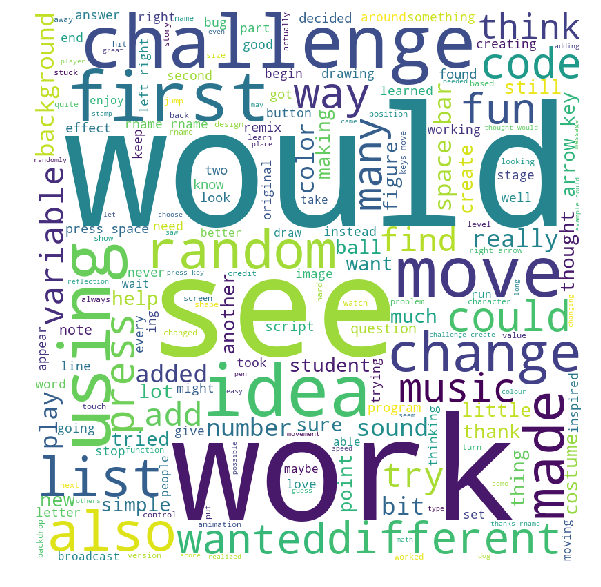

In [40]:
from wordcloud import WordCloud

# Uncomment the following line to pull in a specific column of texts for the word cloud
# wcText = dfReflectiveMatrix.loc[dfReflectiveMatrix['difficulty'] >= 1]['writing'].tolist()
wcTexts = ' '.join(difficultyTexts)

wordcloud = WordCloud(width = 800, height = 800, 
                background_color ='white', 
                stopwords = stopwords_cloud, 
                min_font_size = 10).generate(wcTexts) 
  
# plot the WordCloud image                        
plt.figure(figsize = (8, 8), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad = 0) 
  
plt.show()

# Exploring the data in other ways

From here, I wanted to start to explore relationships between columns in other ways. This was also a good opportunity to practice data visualization using python & matplotlib!

In [44]:
# Code snippet for filtering by a single person

dfEng.loc[dfEng['project_author_username']=='Curious_AEF']



,studio,project_id,title,description,instructions,writing,author/id,project_author_username,image,history/created,...,studio_numberscript_count,variable_count,list_count,comment_count,costume_count,sprite_count,block_count,block_unique_count,random_block_count,language
53,18,237179263,Boston Weather_GU_Day19,I wanted to use humor in my project. I combine...,Click the green flag to begin.\n,I wanted to use humor in my project. I combine...,24741621,Curious_AEF,https://cdn2.scratch.mit.edu/get_image/project...,2018-07-23T18:52:33.000Z,...,19,33,0,1,0,20,12,171,28,en
177,17,237068341,Get Smart_GU_Day18,This project took on a life of its own. I didn...,"Click the green flag to begin. Then, help Maxw...",This project took on a life of its own. I didn...,24741621,Curious_AEF,https://cdn2.scratch.mit.edu/get_image/project...,2018-07-22T12:23:20.000Z,...,18,34,3,2,1,26,16,287,39,en
300,19,237278244,Get Smart enhanced_GU_Day20,Day20 changes include: addition of background ...,"Click the green flag to begin. Then, help Maxw...",Day20 changes include: addition of background ...,24741621,Curious_AEF,https://cdn2.scratch.mit.edu/get_image/project...,2018-07-24T17:52:55.000Z,...,20,42,3,2,1,31,18,331,43,en
405,20,237357887,21 Days Archive,Just wanted to access the prompts & quotes fro...,Press the space bar. Then enter the day number...,Just wanted to access the prompts & quotes fro...,24741621,Curious_AEF,https://cdn2.scratch.mit.edu/get_image/project...,2018-07-25T12:57:18.000Z,...,21,2,0,2,0,7,2,10,7,en
424,20,237381094,Who was POTUS when you were born?_GU_Day21,What makes you curious? Is it a concept or the...,Fingers crossed that this will keep track of e...,What makes you curious? Is it a concept or the...,24741621,Curious_AEF,https://cdn2.scratch.mit.edu/get_image/project...,2018-07-25T17:19:33.000Z,...,21,23,11,2,1,14,12,118,17,en
475,20,236980827,Rube Goldberg Fan,Prompt: Play with ways to show how a force ma...,Click the green flag to turn on the fan.\n(Yes...,Prompt: Play with ways to show how a force ma...,24741621,Curious_AEF,https://cdn2.scratch.mit.edu/get_image/project...,2018-07-21T00:11:50.000Z,...,21,63,1,0,4,57,20,396,34,en
485,20,238069857,Who was POTUS when you were born?_GU_Day21 Imp...,What makes you curious? Is it a concept or the...,Fingers crossed that this will keep track of e...,What makes you curious? Is it a concept or the...,24741621,Curious_AEF,https://cdn2.scratch.mit.edu/get_image/project...,2018-08-02T15:42:37.000Z,...,21,26,11,2,1,19,13,141,24,en
564,7,236251723,GU_Day8,"Oh, there were so many times I had to get unst...",Identify Prime Numbers from 1 to 30. \nIf the ...,"Oh, there were so many times I had to get unst...",24741621,Curious_AEF,https://cdn2.scratch.mit.edu/get_image/project...,2018-07-12T18:11:23.000Z,...,8,10,5,0,0,45,3,146,28,en
742,8,236339412,GU_Day9_sidetracked,I was curious about the relationship between c...,"Click on the green flag, then choose what colo...",I was curious about the relationship between c...,24741621,Curious_AEF,https://cdn2.scratch.mit.edu/get_image/project...,2018-07-13T17:18:32.000Z,...,9,4,2,0,0,4,2,31,17,en
747,8,236342047,GU_Day9,"As I played with my project, I realized that I...",The world is a stage! (I have been enjoying sh...,"As I played with my project, I realized that I...",24741621,Curious_AEF,https://cdn2.scratch.mit.edu/get_image/project...,2018-07-13T17:52:40.000Z,...,9,6,0,0,0,10,3,47,17,en


## Number of projects in each studio

In [58]:
# Project_num is used later; that column can be swapped for any of the ones in the dfReflectiveMatrix to sort by keyword.

dfProjects = pd.DataFrame(columns = ["studio","project_num","total_projects_written","total_projects"])

for i in range(0,21):
    dfProjects.at[i,'studio'] = i+1
    dfProjects.at[i,'project_num'] = len(dfReflectiveMatrix[(dfReflectiveMatrix['studio']==i) & 
                                                            (dfReflectiveMatrix['difficulty']>0)])
    dfProjects.at[i,'total_projects_written'] = len(dfReflectiveMatrix[(dfReflectiveMatrix['studio']==i)])
    dfProjects.at[i,'total_projects'] = len(merged_df[(merged_df['studio']==i)])
      
dfProjects.tail()


,studio,project_num,total_projects_written,total_projects
16,17,76,106,123
17,18,80,103,119
18,19,78,107,127
19,20,94,105,121
20,21,71,90,107


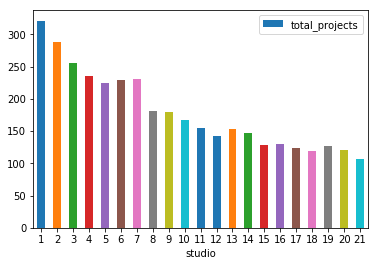

In [59]:
ax1 = dfProjects.plot.bar(x='studio', y='total_projects', rot=0)

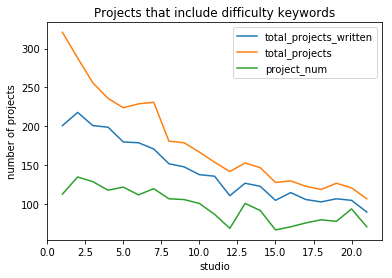

In [60]:
# to swap out the column of reflective keywords, see above to change project_num.

%matplotlib inline

import matplotlib
import numpy as np
import matplotlib.pyplot as plt

x = dfProjects['studio']
y1 = dfProjects['total_projects_written']
y2 = dfProjects['total_projects']
y3 = dfProjects['project_num']

plt.plot(x, y1)
plt.plot(x, y2)
plt.plot(x, y3)

plt.legend()

plt.xlabel('studio')
plt.ylabel('number of projects')
plt.title('Projects that include difficulty keywords')
plt.show()

## Interactive graphs by username

Heavily relied on [this link](https://community.plot.ly/t/how-to-filter-scatter-plot-data-by-3rd-or-more-columns-in-pandas-dataframe-offline/17005) to tell me how to make this interactive graph, but I found this to be really helpful! 

In [62]:
import plotly.graph_objs as go
from plotly.offline import init_notebook_mode, iplot

init_notebook_mode()

fig = go.Figure()
names = []
for name, name_dfEng in dfEng.groupby('project_author_username'):
    names.append(name)
    fig.add_scatter(x=name_dfEng.studio,
                    y=name_dfEng.writing_length,
                    mode='markers',
                    name=name,
                    showlegend=False,
                    visible=name == 'a')
    
    
buttons = []
for i, name in enumerate(names):
    visible = [False]*len(names)
    visible[i] = True
    buttons.append(
        dict(
            method='restyle',
            args=[{'visible': visible}],
            label=name
        ))


fig.layout = go.Layout(
    xaxis=dict(
        range=[dfEng.studio.min() - 1, dfEng.studio.max() + 1]
    ),
    yaxis=dict(
        range=[dfEng.writing_length.min() - 1, dfEng.writing_length.max() + 1]
    ),
    updatemenus=list([
        dict(
            x=-0.05,
            y=1,
            buttons=buttons,
            yanchor='top'
        )
    ]),
)
iplot(fig)

Examples: Karen Brennan v. Tarmelop (Scratch Team member)

In [73]:
from IPython.core.display import display, HTML

display(HTML('<img src="imgs/karenb.png" width="700">'))
display(HTML('<img src="imgs/tarmelop.png" width="700">'))

## Number of projects v. number of projects with writing
In thinking about the question of whether writing supports persistence in Getting Unstuck, I had some challenges in constructing this table.

In [79]:
# This makes the list of everyone who completed Getting Unstuck.

authors = merged_df['project_author_username'].value_counts()[merged_df['project_author_username'].value_counts()>=20].index.tolist()

print(authors)


['carlapoppi', 'Curious_AEF', 'scratchteacheralpha032', 'PinkGoldPeachyKeen', 'antonellamazzobel', 'HeloisaZal', 'KPSRm27', '5Bics1', 'alirb', 'rbotero', 'jakel181', 'gerulm', 'DominicMyers', 'IT_Lady', 'techteech', 'Marharold', 'Nanoks', 'scrigno42', 'CMSSowders', 'RoboSquid', 'noli89', 'jamesdotca', 'chrise07', 'AnitaVaca', 'nbblasko', 'Carcovi', 'MadameFrancaise', 'Ladyra', 'welfringer', 'mstone326', 'valeriamuccio', 'enauman', 'aitan', 'MrQuentin', 'elimasa', 'CyberParra', 'mccormba', 'kbardelli1', 'jennykostka', 'rita3ferr', 'karenb', 'mariateresas', 'maths77680', 'incantotoscano', 'JacobAtInnovEd', 'fun-timeonly', 'jsh', 'WhaeaJR', 'IainMillar', 'amthom687', 'shad647', 'ClaGua', 'sircan', 'sleifer', 'McScience_Lego', 'laurafreina', 'fabiomanuppella', 'NoeBranford', 'annag79', 'paulinah', 'marlanreg', 'StephanieLing', 'ANTONELLA_CARROZZINI', 'crazydoodlefish', 'jancarlson', 'gromko', 'federica_lizzi', 'clarimer', 'Mattioli2', 'mauretta', 'ssjpom', 'Mittensbrother', 'sondraconte', 

In [80]:
# Counting the number of projects someone has submitted and adding that to the Counts column for 
# EVERY project.

merged_df['Counts'] = merged_df.groupby(['project_author_username'])['studio'].transform('count')

merged_df.head()

,studio,project_id,title,description,instructions,writing,author/id,project_author_username,image,history/created,...,variable_count,list_count,comment_count,costume_count,sprite_count,block_count,block_unique_count,random_block_count,language,Counts
0,18,237042971,Steven and the Stevens [MV],Animation is hard! And time consuming! But aft...,Press the green flag to watch! (Inspired by St...,Animation is hard! And time consuming! But aft...,2745846,paulinah,https://cdn2.scratch.mit.edu/get_image/project...,2018-07-22T00:59:37.000Z,...,8,4,0,0,8,1,114,40,en,21
1,18,237100206,Grumpy Bubbles,"Big thanks to @jsh for his Day 1 project, Rive...","First, check out @jsh's River Waltz: https://s...","Big thanks to @jsh for his Day 1 project, Rive...",39526,karenb,https://cdn2.scratch.mit.edu/get_image/project...,2018-07-23T00:25:41.000Z,...,4,10,1,6,2,1,99,40,en,22
2,18,237093421,Raindrops,I've found that I don't always initially consi...,Press the green flag.,I've found that I don't always initially consi...,25705937,alirb,https://cdn2.scratch.mit.edu/get_image/project...,2018-07-22T22:22:17.000Z,...,4,2,0,0,9,2,39,23,en,25
3,18,237098671,Night Rain,After simulating rain drops for today's challe...,"Press the green flag, allow for the microphone...",After simulating rain drops for today's challe...,25705937,alirb,https://cdn2.scratch.mit.edu/get_image/project...,2018-07-23T00:06:28.000Z,...,7,0,0,0,10,3,66,28,en,25
4,18,237111696,Lights,This project was created for Day 19 of Getting...,Enjoy the procession of the clones!,This project was created for Day 19 of Getting...,56239,jsh,https://cdn2.scratch.mit.edu/get_image/project...,2018-07-23T03:16:00.000Z,...,6,10,0,0,2,1,131,34,en,21


merged_df.head()

## Reflection word length by studio 
(E.g., were there longer reflections for one day more than another? )

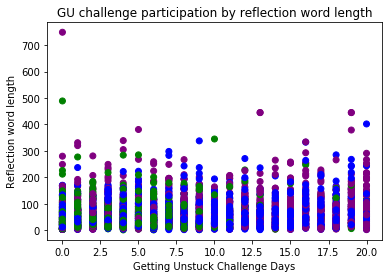

In [81]:
merged_df['writing_length'] = merged_df['writing'].str.split().str.len()

# This creates the color buckets for projects. Green for projects from participants who did less than 10 days
# Blue for participants who did more than 10 but didn't complete.
# Purple for participants who did all 21.
conditions = [
    (merged_df['Counts'] <= 10),
    (merged_df['Counts'] < 21 ) & (merged_df['Counts'] > 10),
    (merged_df['Counts'] >= 21)]
choices = ['green', 'blue', 'purple']
merged_df['color'] = np.select(conditions, choices, default='black')
merged_df.head()


plt.scatter(merged_df['studio'], 
            merged_df['writing_length'], c=merged_df['color'])
plt.title("GU challenge participation by reflection word length")
plt.xlabel("Getting Unstuck Challenge Days")
plt.ylabel("Reflection word length")

plt.show()





In [83]:
# Test look at someone who only did some of the projects.

merged_df.loc[merged_df['project_author_username'] == 'PrescottRoadrunner']

,studio,project_id,title,description,instructions,writing,author/id,project_author_username,image,history/created,...,comment_count,costume_count,sprite_count,block_count,block_unique_count,random_block_count,language,Counts,writing_length,color
1676,4,235920812,Nano Jump,"Created for Getting Unstuck Day 5: ""Flying Lea...",Click the green flag to start and the up arrow...,"Created for Getting Unstuck Day 5: ""Flying Lea...",17801875,PrescottRoadrunner,https://cdn2.scratch.mit.edu/get_image/project...,2018-07-09T17:03:33.000Z,...,0,0,49,10,209,32,en,4,120.0,green
1919,0,235630911,Avoiding an Asteroid Collision,This project is in response to the Getting Uns...,Click the green flag to begin.,This project is in response to the Getting Uns...,17801875,PrescottRoadrunner,https://cdn2.scratch.mit.edu/get_image/project...,2018-07-06T00:01:52.000Z,...,0,0,32,4,54,19,en,4,74.0,green
2205,1,235710051,Rose Clicker,"Getting Unstuck Challenge Day 2: ""Display a fl...","Click the green flag to start, then click anyw...","Getting Unstuck Challenge Day 2: ""Display a fl...",17801875,PrescottRoadrunner,https://cdn2.scratch.mit.edu/get_image/project...,2018-07-06T18:47:00.000Z,...,0,0,4,2,34,23,en,4,74.0,green
2486,2,235790642,More Cowbell!,This project is for Getting Unstuck: Day 3 and...,Click the green flag to start. Once you hear t...,This project is for Getting Unstuck: Day 3 and...,17801875,PrescottRoadrunner,https://cdn2.scratch.mit.edu/get_image/project...,2018-07-07T23:43:31.000Z,...,0,0,3,1,51,17,en,4,127.0,green


## Participation by number of projects w/ writing in them
For this I counted the number of projects a participant made v. the number of projects they made that had writing in them.

What is confusing about this is that it's total number of projects a participant has made. One thing I could try would be to only keep the first project a participant made for each studio. (E.g., drop duplicates of author/id from the original studio CSV files before adding them). That's why the graph below shows more than 21 on the X axis.

In [94]:
new_unique = merged_df.drop_duplicates(subset='author/id', keep='last')

# this counts unique authors
new_unique = new_unique.sort_values('project_author_username')
new_unique_list = new_unique['Counts'].tolist()

# new_unique.head()


In [98]:
# declares T/F if there's writing in a column, then counts that.
# False: there is writing; 
# True: there is no writing
# [probably I could have counted the null columns but wasn't quite sure...]
merged_df['writing_yes'] = merged_df['writing'].isna()
merged_df['writingTotal'] = merged_df.groupby(['author/id'])['writing_length'].sum()

count_series = merged_df.groupby(['project_author_username', 'writing_yes']).size()
new_df = count_series.to_frame(name = 'writingTotal').reset_index()

# drops duplicates in the new df (b/c if someone has both true/false, e.g., they wrote in some projects
# and not others, then this drops the True entries)
new_renamed = new_df.drop_duplicates(subset='project_author_username', keep='first')
new_renamed['Counts'] = new_unique_list

new_renamed.head(10)


/Users/paulina/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:14: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy



,project_author_username,writing_yes,writingTotal,Counts
0,33limekilnsja,False,14,14
1,5Bics1,False,25,25
2,ANTONELLA_CARROZZINI,False,21,21
3,Alfonsinacinzia,False,6,8
5,AnitaVaca,False,23,23
6,BCS-Scratch,False,2,2
7,Barbara27,False,1,1
8,Bevvy,False,1,1
9,CBAtech,False,13,13
10,CDBrian,False,6,6


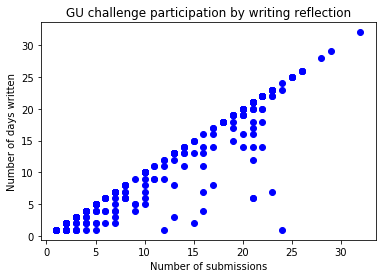

In [100]:
plt.scatter(new_renamed['Counts'], 
            new_renamed['writingTotal'], c='blue')
plt.title("GU challenge participation by writing reflection")
plt.xlabel("Number of submissions")
plt.ylabel("Number of days written")

plt.show()


# Bonus: Ngrams!
Haven't had much time here to play with this, but thought I'd include it anyway. Not entirely sure how to think about these to be honest...

In [90]:
from textblob import TextBlob

In [91]:
lowerWriting = dfEng['writing'].str.lower()

writingNgrams = TextBlob(lowerWriting[0]).ngrams(3)


In [92]:
# Given a list of n-grams, return a dictionary of KWICs,
# indexed by keyword.
# https://programminghistorian.org/en/lessons/output-keywords-in-context-in-html-file#making-an-n-gram-dictionary

def nGramsToKWICDict(ngrams):
    keyindex = len(ngrams[0]) // 2

    kwicdict = {}

    for k in ngrams:
        if k[keyindex] not in kwicdict:
            kwicdict[k[keyindex]] = [k]
        else:
            kwicdict[k[keyindex]].append(k)
    return kwicdict

nGramsToKWICDict(writingNgrams)

# Future directions
* Looking at the list of most prolific authors, I'm curious about the people who weren't immediately salient to the facilitation team. What did they make? Who were they talking to?
* One thing I could try would be to only keep the first project a participant made for each studio. (E.g., drop duplicates of author/id from the original studio CSV files before adding them). 
* Look into ngram frequency?